In [1]:
from IPython.display import display
import pandas as pd
from matplotlib import gridspec
import matplotlib.pyplot as plt
from baselines.get_results import (construct_parser, main, 
    plot_confusion, plot_1d_array_per_deg, round_to_n, plot_log_file)

In [2]:
# CONFIG - EDIT THESE

# location of logs and model checkpoints
output_dir = 'output'

# location of the pianoroll and command corpus datasets
in_dir = '/disk/scratch/s0816700/data/acme'

# Names of tasks (folders in output_dir)
task_names = [
    'task1',
    'task1weighted',
    'task2',
    'task3',
    'task3weighted',
    'task4',
]


# The names of variables gridsearched over for each task
sn = ['lr', 'wd', 'hid']
setting_names_conf = {
    'task1': sn,
    'task1weighted': sn,
    'task2': sn,
    'task3': sn,
    'task3weighted': sn,
    'task4': ['lr', 'wd', 'hid', 'lay'],
}

formats_conf = {
    'task1': 'command',
    'task1weighted': 'command',
    'task2': 'command',
    'task3': 'pianoroll',
    'task3weighted': 'pianoroll',
    'task4': 'pianoroll',
}
seq_len_conf = {
    'task1': '1000',
    'task1weighted': '1000',
    'task2': '1000',
    'task3': '250',
    'task3weighted': '250',
    'task4': '250',
}
metrics_conf = {
    'task1': 'rev_f',
    'task1weighted': 'rev_f',
    'task2': 'avg_acc',
    'task3': 'f',
    'task3weighted': 'f',
    'task4': 'helpfulness',
}
task_desc_conf = {
    'task1': 'Error Detection',
    'task1weighted': 'Error Detection',
    'task2': 'Error Classification',
    'task3': 'Error Location',
    'task3weighted': 'Error Location',
    'task4': 'Error Correction',
}


def get_items_from_conf(conf_dict, task_names):
    return [
        item
        for task_name, item in conf_dict.items()
        if task_name in task_names
    ]

setting_names = get_items_from_conf(setting_names_conf, task_names)
formats = get_items_from_conf(formats_conf, task_names)
setting_names = get_items_from_conf(setting_names_conf, task_names)
seq_len = get_items_from_conf(seq_len_conf, task_names)
metrics = get_items_from_conf(metrics_conf, task_names)
task_desc = get_items_from_conf(task_desc_conf, task_names)
task_desc = [tt.replace(' ', '') for tt in task_desc]

args_str = (
    f"--output_dir {output_dir} "
#     f"--save_plots {output_dir} "
    f"--in_dir {in_dir} "
    f"--task_names {' '.join(task_names)} "
    f"--setting_names {' '.join([str(sn).replace(' ', '') for sn in setting_names])} "
    f"--formats {' '.join(formats)} "
    f"--seq_len {' '.join(seq_len)} "
    f"--metrics {' '.join(metrics)} "
    f"--task_desc {' '.join(task_desc)} "
    f"--splits train valid test "
#     f"--splits test "
    "--show_plots"
)
args_str

"--output_dir output --in_dir /disk/scratch/s0816700/data/acme --task_names task1 task1weighted task2 task3 task3weighted task4 --setting_names ['lr','wd','hid'] ['lr','wd','hid'] ['lr','wd','hid'] ['lr','wd','hid'] ['lr','wd','hid'] ['lr','wd','hid','lay'] --formats command command command pianoroll pianoroll pianoroll --seq_len 1000 1000 1000 250 250 250 --metrics rev_f rev_f avg_acc f f helpfulness --task_desc ErrorDetection ErrorDetection ErrorClassification ErrorLocation ErrorLocation ErrorCorrection --splits train valid test --show_plots"

task1 plots ====================


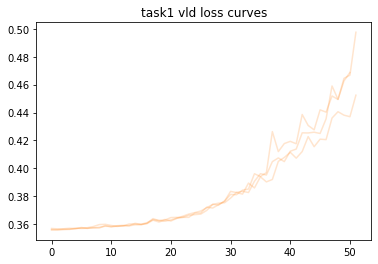

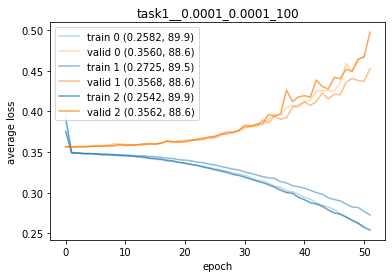

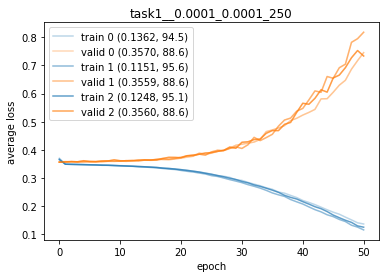

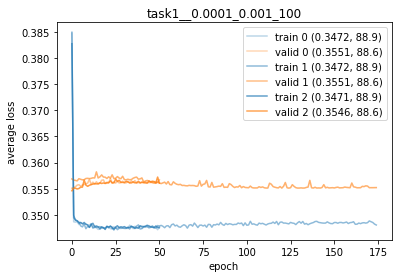

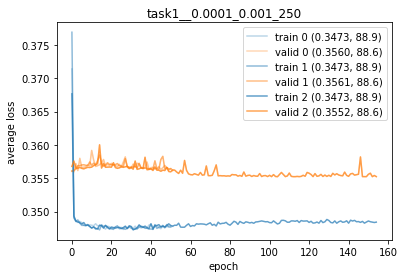

...

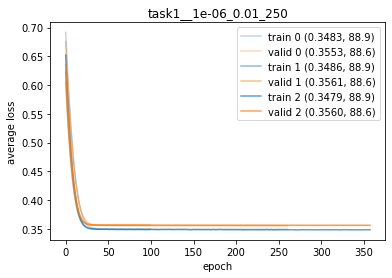

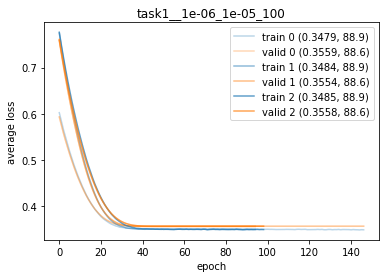

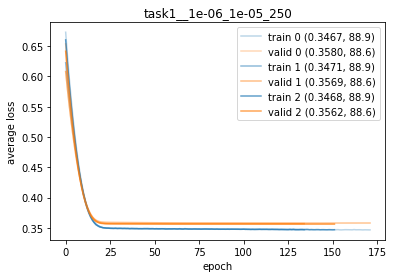

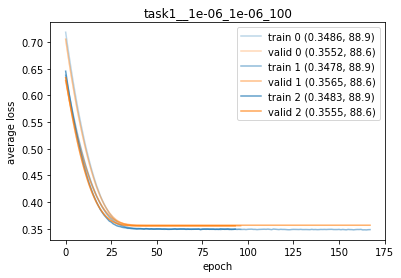

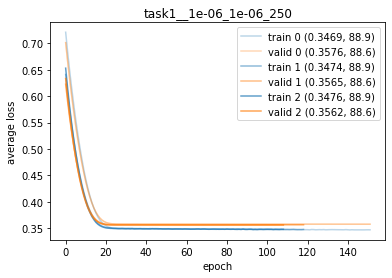

<Figure size 432x288 with 0 Axes>

task1weighted plots ====================


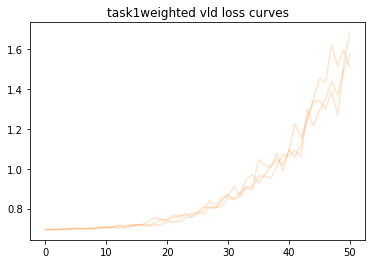

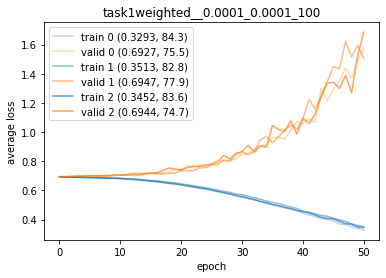

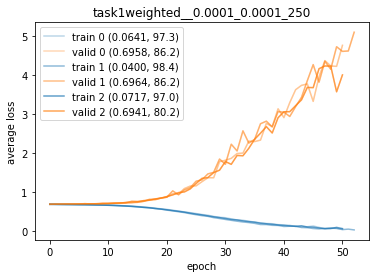

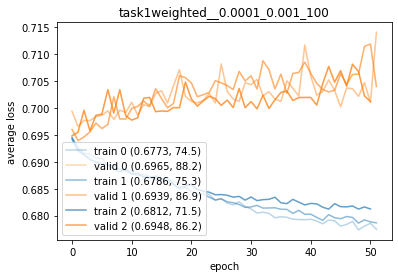

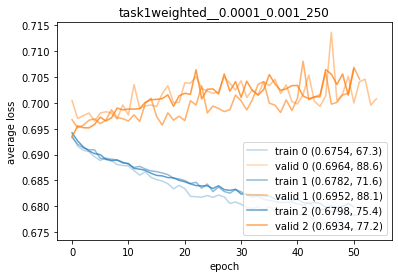

...

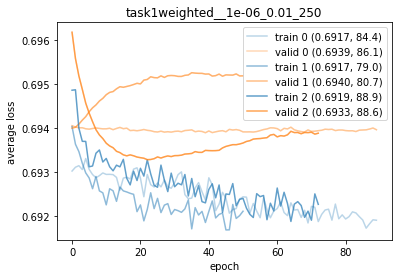

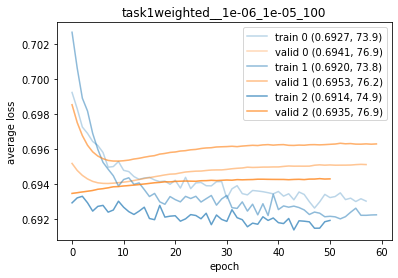

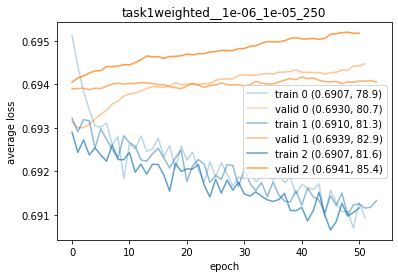

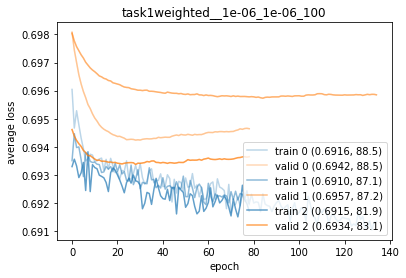

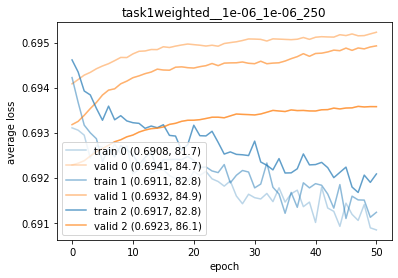

<Figure size 432x288 with 0 Axes>

task2 plots ====================


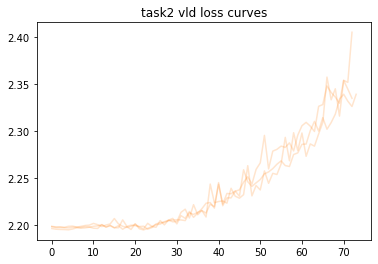

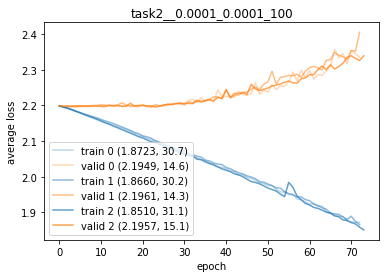

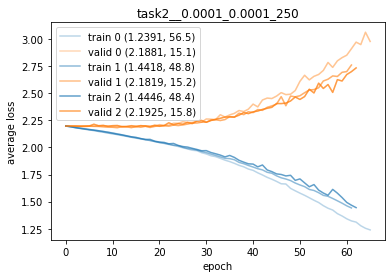

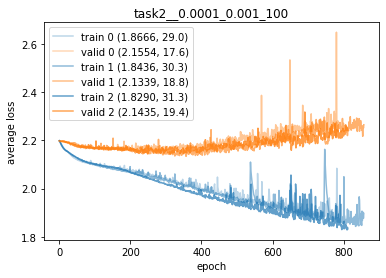

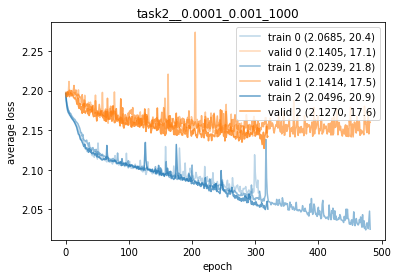

...

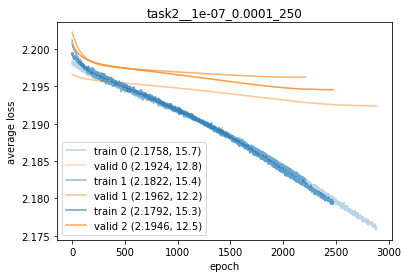

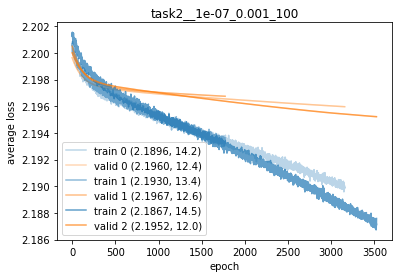

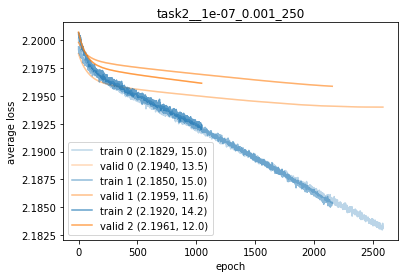

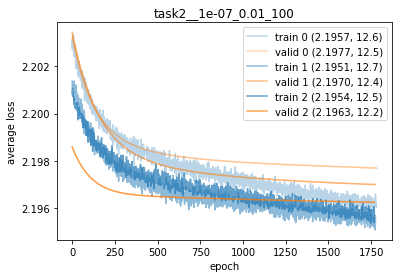

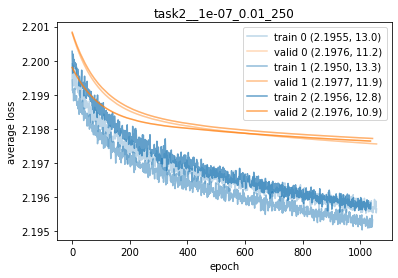

<Figure size 432x288 with 0 Axes>

task3 plots ====================


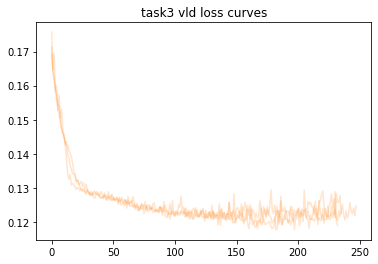

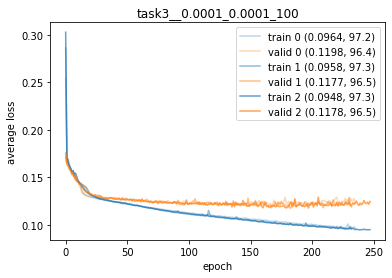

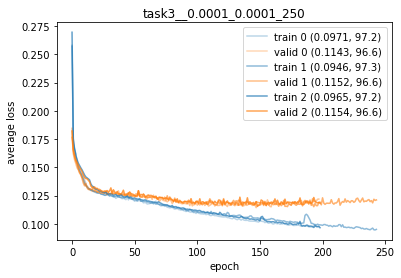

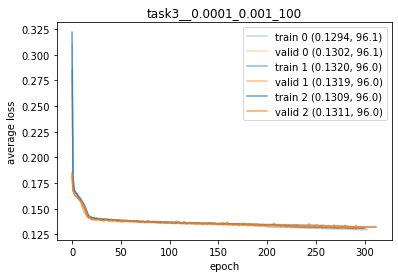

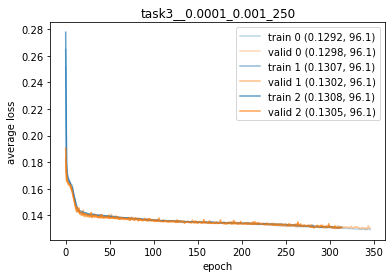

...

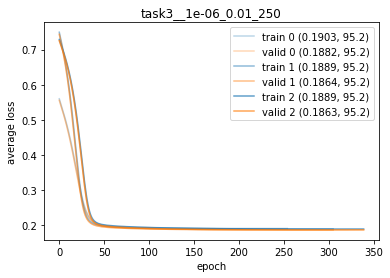

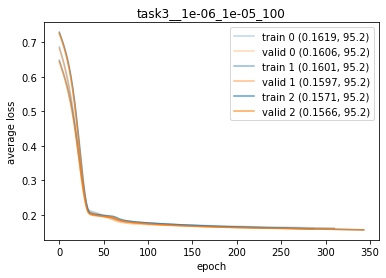

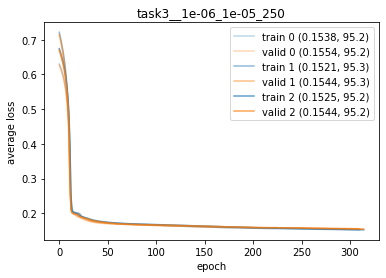

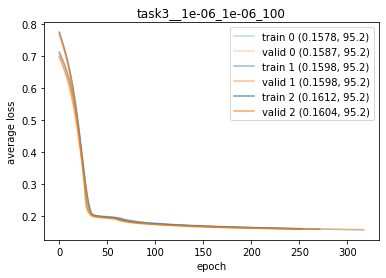

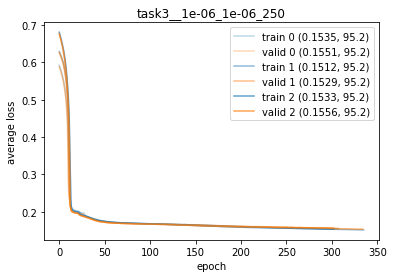

<Figure size 432x288 with 0 Axes>

task3weighted plots ====================


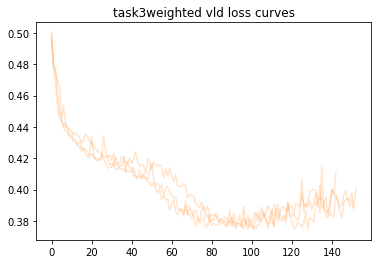

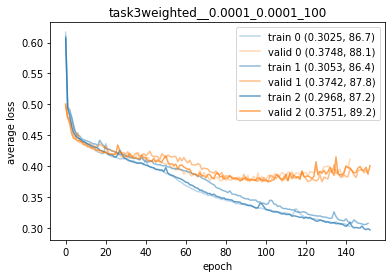

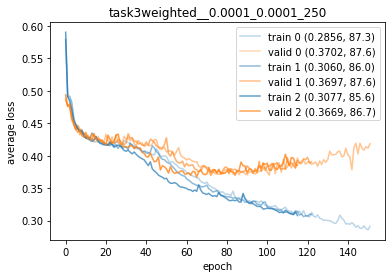

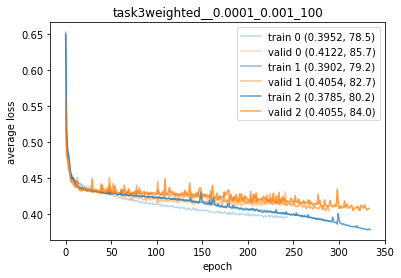

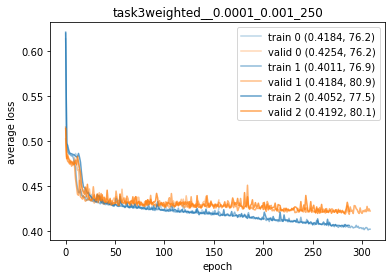

...

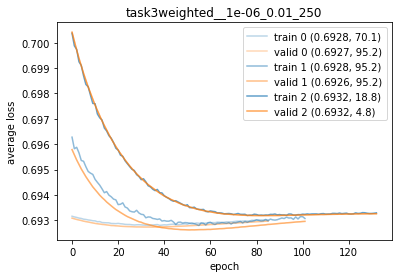

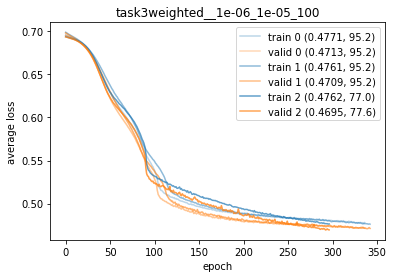

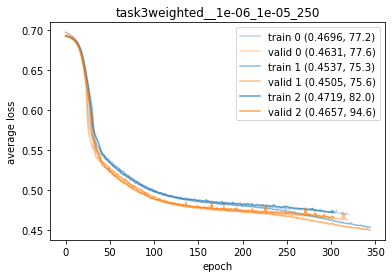

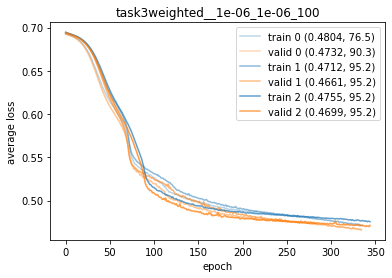

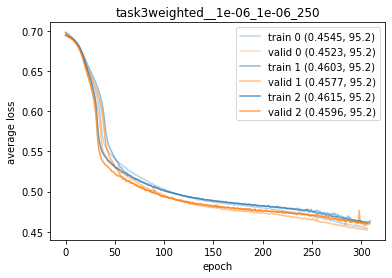

<Figure size 432x288 with 0 Axes>

task4 plots ====================


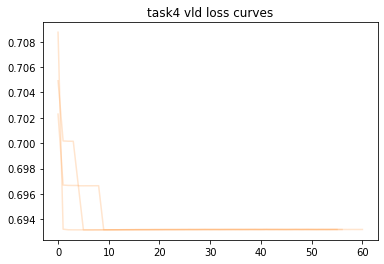

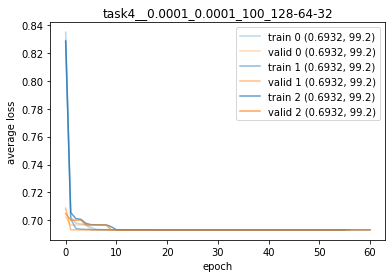

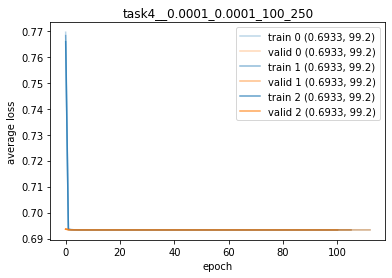

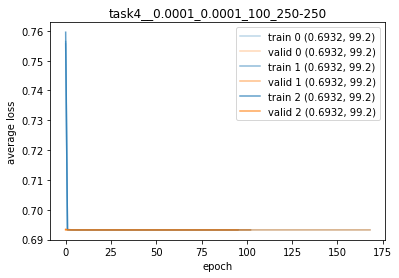

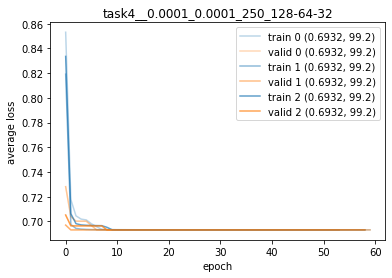

...

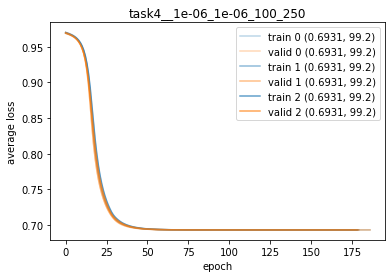

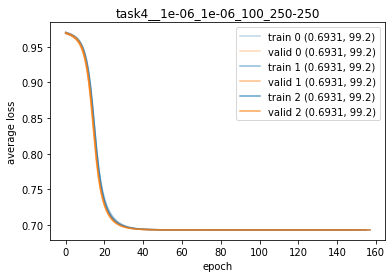

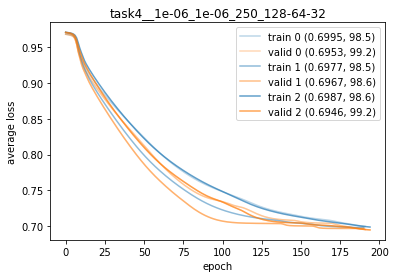

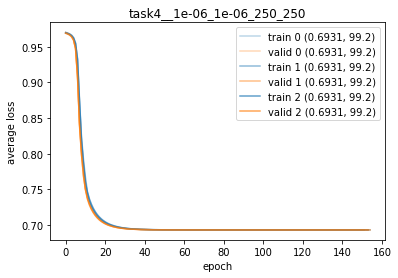

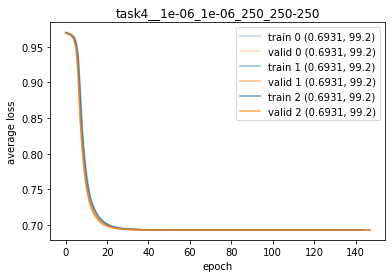

<Figure size 432x288 with 0 Axes>

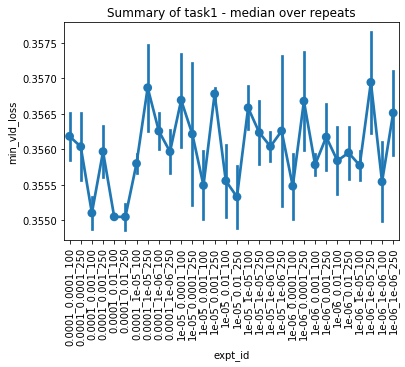

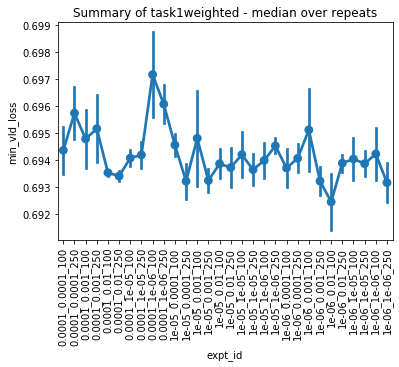

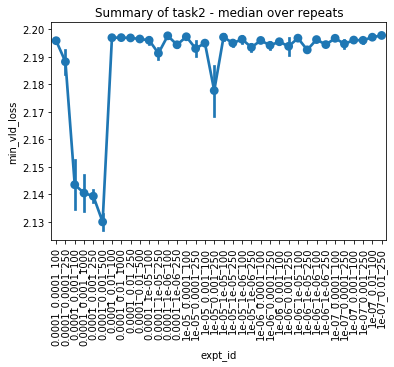

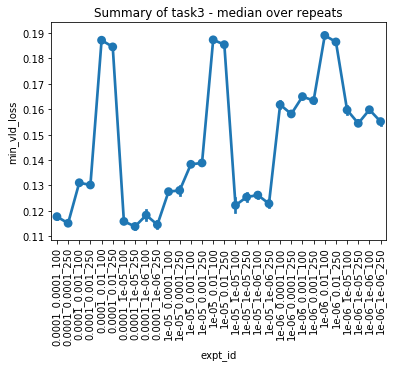

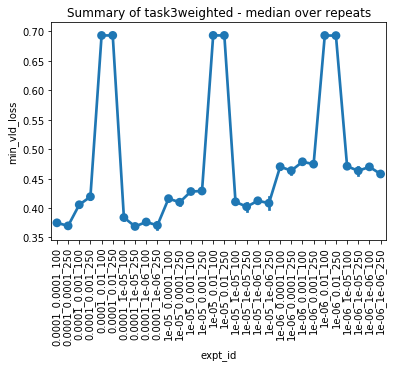

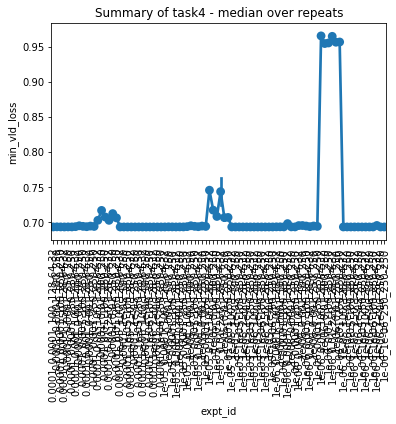

best models: {'task1': 'output/task1/task1__1e-05_0.0001_250_0.checkpoint.best', 'task1weighted': 'output/task1weighted/task1weighted__1e-05_0.001_100_1.checkpoint.best', 'task2': 'output/task2/task2__0.0001_0.001_1000_2.checkpoint.best', 'task3': 'output/task3/task3__0.0001_1e-05_250_2.checkpoint.best', 'task3weighted': 'output/task3weighted/task3weighted__0.0001_1e-06_250_2.checkpoint.best', 'task4': 'output/task4/task4__0.0001_1e-06_100_128-64-32_0.checkpoint.best'}


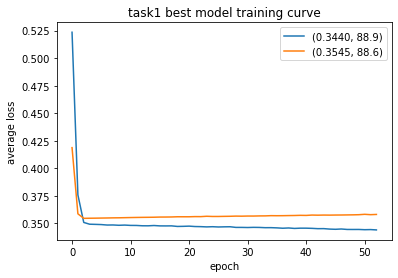

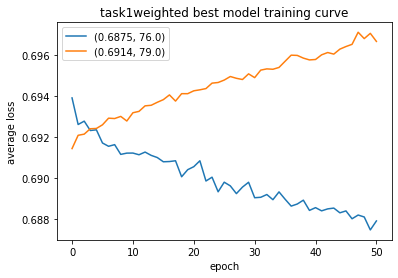

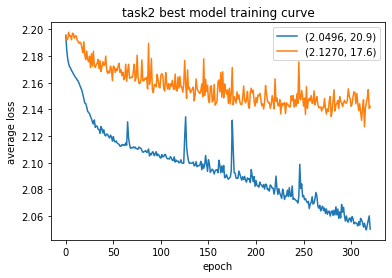

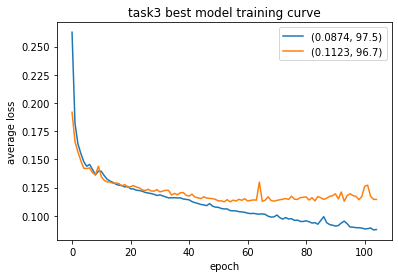

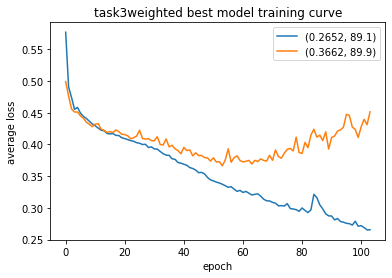

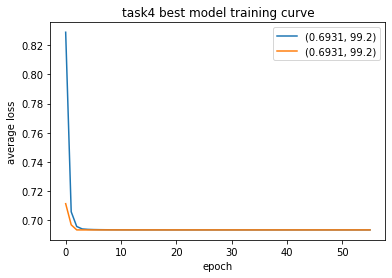

Loading Dataset: 18011it [00:00, 114849.63it/s]
Loading Dataset: 0it [00:00, ?it/s]

Loading train CommandDataset from /disk/scratch/s0816700/data/acme/train_cmd_corpus.csv
Creating train DataLoader
Loading valid CommandDataset from /disk/scratch/s0816700/data/acme/valid_cmd_corpus.csv


Loading Dataset: 2252it [00:00, 121442.73it/s]
Loading Dataset: 2251it [00:00, 142157.32it/s]


Creating valid DataLoader
Loading test CommandDataset from /disk/scratch/s0816700/data/acme/test_cmd_corpus.csv
Creating test DataLoader
Loading model output/task1/task1__1e-05_0.0001_250_0.checkpoint.best
Creating Tester
Attempting to test on GPU
Total Parameters: 416342
Evaluating train split


test epoch 0: 100%|██████████ batch | 282/282 [00:13<00:00, 21.56it/s, avg_loss=0.349]

P, R, F-measure: 0.8889567486536005, 1.0, 0.9412145082593616
Reverse P, R, F-measure: 0, 0, 0
Avg loss: 0.3491448345983732
Total Parameters: 416342
Evaluating valid split



test epoch 0: 100%|██████████ batch | 36/36 [00:01<00:00, 18.68it/s, avg_loss=0.355]

P, R, F-measure: 0.8858792184724689, 1.0, 0.9394866964916412
Reverse P, R, F-measure: 0, 0, 0
Avg loss: 0.35453953158580176
Total Parameters: 416342
Evaluating test split



test epoch 0: 100%|██████████ batch | 36/36 [00:01<00:00, 19.99it/s, avg_loss=0.344]

P, R, F-measure: 0.8916037316748112, 1.0, 0.9426961014560826
Reverse P, R, F-measure: 0, 0, 0
Avg loss: 0.3436002967120382



Loading Dataset: 18011it [00:00, 170474.61it/s]
Loading Dataset: 2252it [00:00, 179253.29it/s]
Loading Dataset: 2251it [00:00, 243466.27it/s]

Loading train CommandDataset from /disk/scratch/s0816700/data/acme/train_cmd_corpus.csv
Creating train DataLoader
Loading valid CommandDataset from /disk/scratch/s0816700/data/acme/valid_cmd_corpus.csv
Creating valid DataLoader
Loading test CommandDataset from /disk/scratch/s0816700/data/acme/test_cmd_corpus.csv
Creating test DataLoader
Loading model output/task1weighted/task1weighted__1e-05_0.001_100_1.checkpoint.best


Creating Tester
Attempting to test on GPU
Total Parameters: 128042
Evaluating train split


test epoch 0: 100%|██████████ batch | 282/282 [00:08<00:00, 33.96it/s, avg_loss=0.69]

P, R, F-measure: 0.8929158110882957, 0.543189057522953, 0.6754689138285893
Reverse P, R, F-measure: 0.11570547696771853, 0.4785, 0.1863499172427222
Avg loss: 0.6902815756696656
Total Parameters: 128042
Evaluating valid split



test epoch 0: 100%|██████████ batch | 36/36 [00:01<00:00, 29.79it/s, avg_loss=0.69] 

P, R, F-measure: 0.8972267536704731, 0.5513784461152882, 0.6830176963675876
Reverse P, R, F-measure: 0.1276803118908382, 0.5097276264591439, 0.20420888542478566
Avg loss: 0.6896887063768363


Total Parameters: 128042
Evaluating test split


test epoch 0: 100%|██████████ batch | 36/36 [00:01<00:00, 26.82it/s, avg_loss=0.691]

P, R, F-measure: 0.8898233809924306, 0.5271549576482312, 0.6620775969962452
Reverse P, R, F-measure: 0.1064030131826742, 0.46311475409836067, 0.17304747320061256
Avg loss: 0.6910923463881995



Loading Dataset: 0it [00:00, ?it/s]

Loading train CommandDataset from /disk/scratch/s0816700/data/acme/train_cmd_corpus.csv


Loading Dataset: 18011it [00:00, 166539.04it/s]
Loading Dataset: 2252it [00:00, 233610.48it/s]
Loading Dataset: 2251it [00:00, 231083.49it/s]

Creating train DataLoader
Loading valid CommandDataset from /disk/scratch/s0816700/data/acme/valid_cmd_corpus.csv
Creating valid DataLoader
Loading test CommandDataset from /disk/scratch/s0816700/data/acme/test_cmd_corpus.csv
Creating test DataLoader
Loading model output/task2/task2__0.0001_0.001_1000_2.checkpoint.best
Creating Tester
Attempting to test on GPU
Total Parameters: 4564849
Evaluating train split



test epoch 0: 100%|██████████ batch | 282/282 [01:06<00:00,  4.25it/s, avg_loss=2.04]

Accuracy: 21.47576481039365
Avg loss: 2.0442701688606255
Confusion matrix (as [label, output]):
[[0.216      0.014      0.029      0.0745     0.104      0.0575
  0.041      0.1055     0.3585    ]
 [0.15842079 0.0189905  0.03998001 0.08245877 0.12343828 0.06546727
  0.05997001 0.11694153 0.33433283]
 [0.06253127 0.012006   0.09154577 0.14657329 0.14357179 0.01850925
  0.2056028  0.10905453 0.2106053 ]
 [0.0974026  0.01398601 0.05594406 0.22427572 0.1038961  0.03796204
  0.08391608 0.0999001  0.28271728]
 [0.06443556 0.01348651 0.06293706 0.07642358 0.21678322 0.02597403
  0.18581419 0.07542458 0.27872128]
 [0.18575697 0.01842629 0.03685259 0.08814741 0.10856574 0.07370518
  0.05577689 0.11802789 0.31474104]
 [0.0377546  0.01043219 0.08345753 0.11574764 0.15697963 0.00943865
  0.39443616 0.06209637 0.12965723]
 [0.10478589 0.00906801 0.06196474 0.09420655 0.11738035 0.03375315
  0.07808564 0.18992443 0.31083123]
 [0.12143928 0.0089955  0.02748626 0.06596702 0.13493253 0.02098951
  0.0414


test epoch 0: 100%|██████████ batch | 36/36 [00:08<00:00,  4.09it/s, avg_loss=2.13]

Accuracy: 17.71758436944938
Avg loss: 2.130494143569025
Confusion matrix (as [label, output]):
[[0.21011673 0.0155642  0.03501946 0.11673152 0.10505837 0.01945525
  0.06225681 0.13618677 0.29961089]
 [0.148      0.008      0.04       0.12       0.148      0.044
  0.076      0.092      0.324     ]
 [0.04562738 0.01520913 0.07984791 0.11787072 0.13688213 0.02281369
  0.23193916 0.08365019 0.2661597 ]
 [0.1124498  0.01204819 0.07228916 0.16465863 0.12851406 0.01606426
  0.08032129 0.12851406 0.28514056]
 [0.05737705 0.0204918  0.04098361 0.13114754 0.22131148 0.0204918
  0.1557377  0.07786885 0.27459016]
 [0.1547619  0.01984127 0.03968254 0.0952381  0.16666667 0.06349206
  0.04365079 0.14285714 0.27380952]
 [0.05327869 0.01229508 0.06967213 0.14754098 0.15163934 0.03278689
  0.27868852 0.06967213 0.18442623]
 [0.09090909 0.00395257 0.06719368 0.13043478 0.12648221 0.03162055
  0.06324111 0.13833992 0.34782609]
 [0.10833333 0.01666667 0.05       0.10833333 0.11666667 0.00416667
  0.0333333


test epoch 0: 100%|██████████ batch | 36/36 [00:08<00:00,  4.31it/s, avg_loss=2.13]

Accuracy: 16.65926254997779
Avg loss: 2.1314966519744276
Confusion matrix (as [label, output]):
[[0.17622951 0.01639344 0.01639344 0.10655738 0.1147541  0.02459016
  0.06147541 0.1557377  0.32786885]
 [0.19521912 0.00796813 0.05577689 0.09561753 0.10756972 0.06374502
  0.0876494  0.10358566 0.28286853]
 [0.08333333 0.00416667 0.05833333 0.1375     0.1625     0.02916667
  0.1875     0.10416667 0.23333333]
 [0.0876494  0.01593625 0.07968127 0.13944223 0.11952191 0.03187251
  0.12749004 0.13944223 0.25896414]
 [0.09019608 0.02745098 0.06666667 0.09803922 0.21176471 0.02352941
  0.1254902  0.10588235 0.25098039]
 [0.16528926 0.02066116 0.02892562 0.05371901 0.10743802 0.07024793
  0.07024793 0.09090909 0.39256198]
 [0.05737705 0.         0.06557377 0.12704918 0.19262295 0.04098361
  0.27868852 0.08606557 0.15163934]
 [0.10606061 0.00757576 0.04924242 0.14393939 0.14015152 0.03030303
  0.07954545 0.12878788 0.31439394]
 [0.11538462 0.00769231 0.04230769 0.05769231 0.15769231 0.03846154
  0.


Loading Dataset: 18011it [00:00, 110364.33it/s]
Loading Dataset: 2252it [00:00, 111291.98it/s]
Loading Dataset: 0it [00:00, ?it/s]

Loading train PianorollDataset from /disk/scratch/s0816700/data/acme/train_pr_corpus.csv
Creating train DataLoader
Loading valid PianorollDataset from /disk/scratch/s0816700/data/acme/valid_pr_corpus.csv
Creating valid DataLoader
Loading test PianorollDataset from /disk/scratch/s0816700/data/acme/test_pr_corpus.csv


Loading Dataset: 2251it [00:00, 107758.61it/s]


Creating test DataLoader
Loading model output/task3/task3__0.0001_1e-05_250_2.checkpoint.best
Creating Tester
Attempting to test on GPU
Total Parameters: 930530
Evaluating train split


test epoch 0: 100%|██████████ batch | 282/282 [00:33<00:00,  8.37it/s, avg_loss=0.101]

P, R, F-measure: 0.9067772675446396, 0.4035463403052888, 0.5585286651289254
Avg loss: 0.1012973276964762
Total Parameters: 930530
Evaluating valid split



test epoch 0: 100%|██████████ batch | 36/36 [00:04<00:00,  7.53it/s, avg_loss=0.112]

P, R, F-measure: 0.8484250201920488, 0.3533148964795575, 0.49887865755520966
Avg loss: 0.11248414391787395
Total Parameters: 930530
Evaluating test split



test epoch 0: 100%|██████████ batch | 36/36 [00:04<00:00,  7.55it/s, avg_loss=0.109]

P, R, F-measure: 0.8465342454463035, 0.38393391148325356, 0.5282756847113282
Avg loss: 0.10857228352884778



Loading Dataset: 8366it [00:00, 54341.07it/s]

Loading train PianorollDataset from /disk/scratch/s0816700/data/acme/train_pr_corpus.csv


Loading Dataset: 18011it [00:00, 86109.41it/s]
Loading Dataset: 2252it [00:00, 143429.85it/s]
Loading Dataset: 2251it [00:00, 184860.46it/s]


Creating train DataLoader
Loading valid PianorollDataset from /disk/scratch/s0816700/data/acme/valid_pr_corpus.csv
Creating valid DataLoader
Loading test PianorollDataset from /disk/scratch/s0816700/data/acme/test_pr_corpus.csv
Creating test DataLoader
Loading model output/task3weighted/task3weighted__0.0001_1e-06_250_2.checkpoint.best
Creating Tester
Attempting to test on GPU
Total Parameters: 930530
Evaluating train split


test epoch 0: 100%|██████████ batch | 282/282 [00:34<00:00,  8.28it/s, avg_loss=0.34] 

P, R, F-measure: 0.19247194744779286, 0.8763529209126077, 0.31562393116537346
Avg loss: 0.33977431897803073
Total Parameters: 930530
Evaluating valid split



test epoch 0: 100%|██████████ batch | 36/36 [00:04<00:00,  7.38it/s, avg_loss=0.351]

P, R, F-measure: 0.1794204689583401, 0.8247253157934076, 0.2947233462879122
Avg loss: 0.35107422594914006
Total Parameters: 930530
Evaluating test split



test epoch 0: 100%|██████████ batch | 36/36 [00:04<00:00,  7.59it/s, avg_loss=0.343]

P, R, F-measure: 0.18481181674038222, 0.827825956937799, 0.30216534090133845
Avg loss: 0.3434097524326889



Loading Dataset: 18011it [00:00, 123979.38it/s]
Loading Dataset: 2252it [00:00, 78104.54it/s]
Loading Dataset: 0it [00:00, ?it/s]

Loading train PianorollDataset from /disk/scratch/s0816700/data/acme/train_pr_corpus.csv
Creating train DataLoader
Loading valid PianorollDataset from /disk/scratch/s0816700/data/acme/valid_pr_corpus.csv
Creating valid DataLoader
Loading test PianorollDataset from /disk/scratch/s0816700/data/acme/test_pr_corpus.csv


Loading Dataset: 2251it [00:00, 87760.65it/s]


Creating test DataLoader
Loading model output/task4/task4__0.0001_1e-06_100_128-64-32_0.checkpoint.best
Creating Tester
Attempting to test on GPU
Total Parameters: 445972
Evaluating train split


test epoch 0: 100%|██████████ batch | 282/282 [10:14<00:00,  2.18s/it, avg_loss=0.693]

Helpfulness: 0.0
F-measure: 0.0
Avg loss: 0.6931471824645996
Total Parameters: 445972
Evaluating valid split



test epoch 0: 100%|██████████ batch | 36/36 [01:17<00:00,  2.16s/it, avg_loss=0.693]

Helpfulness: 0.0
F-measure: 0.0
Avg loss: 0.6931471824645996
Total Parameters: 445972
Evaluating test split



test epoch 0: 100%|██████████ batch | 36/36 [01:17<00:00,  2.15s/it, avg_loss=0.693]

Helpfulness: 0.0
F-measure: 0.0
Avg loss: 0.6931471827558706



Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



                      avg_acc  \
task1         train  0.888957   
              valid  0.885879   
              test   0.891604   
task1weighted train  0.536006   
              valid  0.546625   
              test   0.520213   
task2         train  0.214758   
              valid  0.177176   
              test   0.166593   
task3         train  0.969566   
              valid  0.966265   
              test   0.967405   
task3weighted train  0.818692   
              valid  0.812401   
              test   0.818232   
task4         train  0.991797   
              valid  0.991736   
              test    0.99208   

                                                       avg_acc_per_deg  \
task1         train      [0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]   
              valid      [0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]   
              test       [0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]   
task1weighted train  [0.4785, 0.544727636181909, 0.512256128064032,...   
  

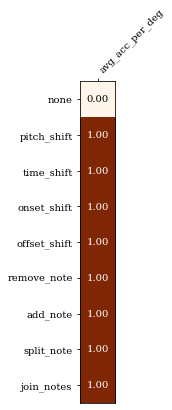

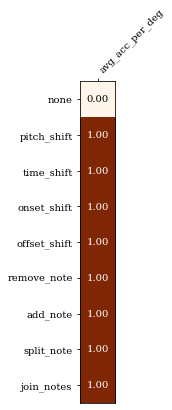

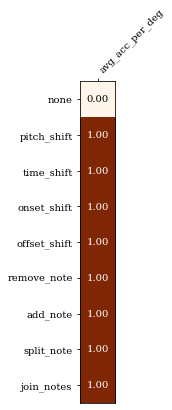

       avg_acc  avg_loss      f      p    r  rev_f  rev_p  rev_r
train    0.889     0.349  0.941  0.889  1.0      0      0      0
valid    0.886     0.355  0.939  0.886  1.0      0      0      0
test     0.892     0.344  0.943  0.892  1.0      0      0      0
task1weighted


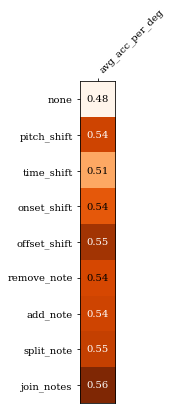

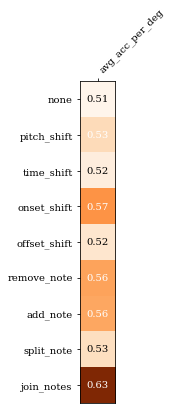

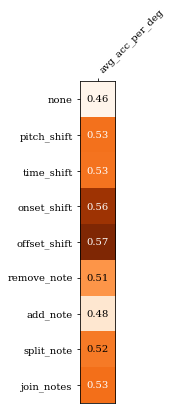

       avg_acc  avg_loss      f      p      r  rev_f  rev_p  rev_r
train    0.536     0.690  0.675  0.893  0.543  0.186  0.116  0.478
valid    0.547     0.690  0.683  0.897  0.551  0.204  0.128  0.510
test     0.520     0.691  0.662  0.890  0.527  0.173  0.106  0.463
task2


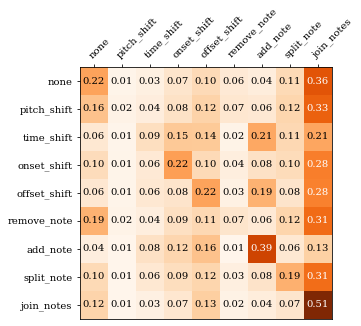

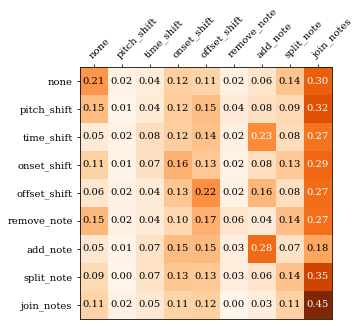

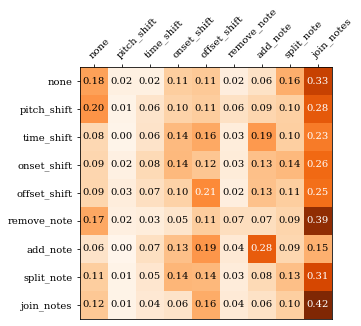

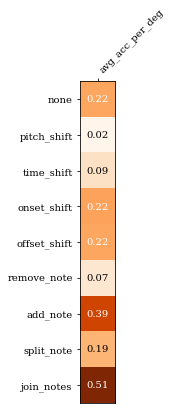

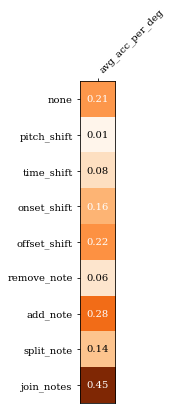

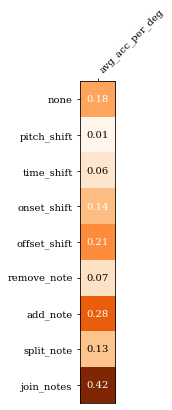

       avg_acc  avg_loss
train    0.215      2.04
valid    0.177      2.13
test     0.167      2.13
task3


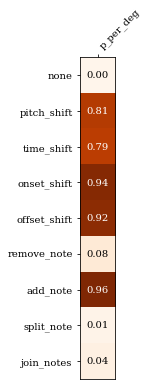

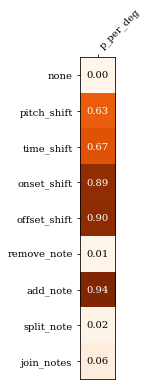

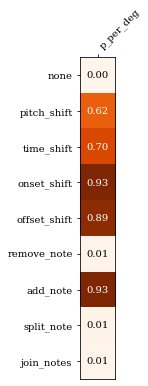

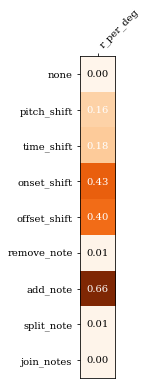

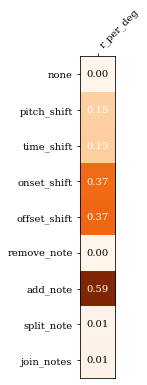

...

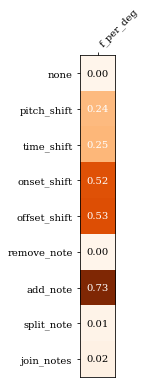

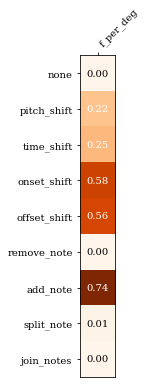

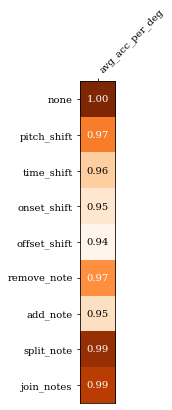

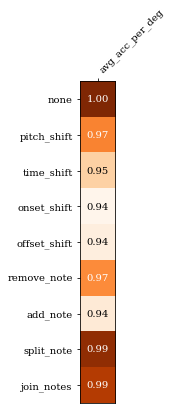

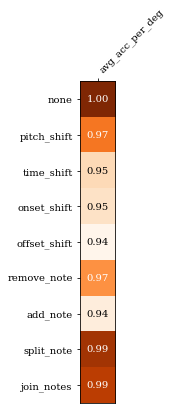

       avg_acc  avg_loss      f      p      r
train    0.970     0.101  0.559  0.907  0.404
valid    0.966     0.112  0.499  0.848  0.353
test     0.967     0.109  0.528  0.847  0.384
task3weighted


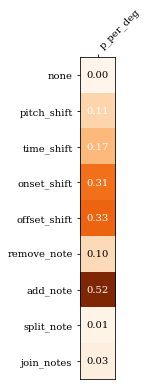

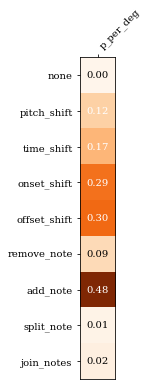

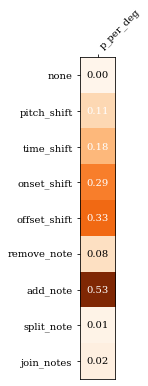

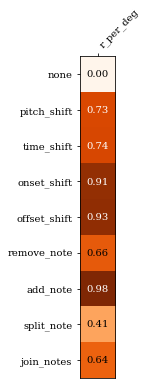

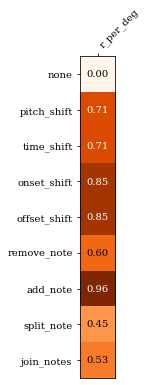

...

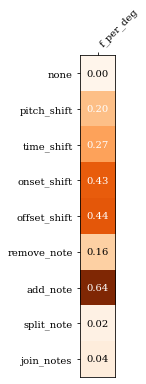

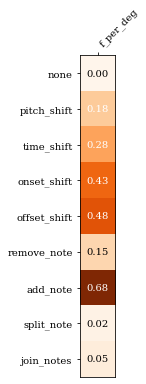

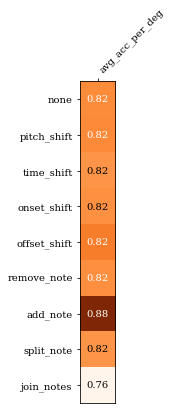

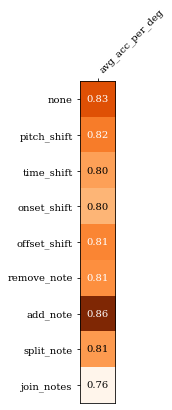

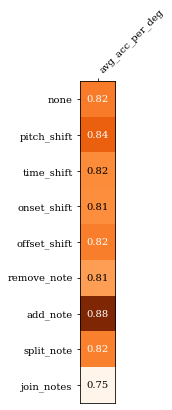

       avg_acc  avg_loss      f      p      r
train    0.819     0.340  0.316  0.192  0.876
valid    0.812     0.351  0.295  0.179  0.825
test     0.818     0.343  0.302  0.185  0.828
task4
       avg_acc  avg_loss  fmeasure  helpfulness
train    0.992     0.693         0            0
valid    0.992     0.693         0            0
test     0.992     0.693         0            0
                                             Loss Metric
Task                Model                               
ErrorDetection      Rule-based              0.466      0
                    task1 baseline          0.344      0
                    task1weighted baseline  0.691  0.173
ErrorClassification Rule-based              2.197  0.113
                    task2 baseline          2.130  0.167
ErrorLocation       Rule-based              0.404      0
                    task3 baseline          0.109  0.528
                    task3weighted baseline  0.343  0.302
ErrorCorrection     Rule-based              0.69

In [3]:
parser = construct_parser()
args = parser.parse_args(args_str.split())
results, min_idx, task_eval_log, res_df, summary_tab_, confusion = main(args)

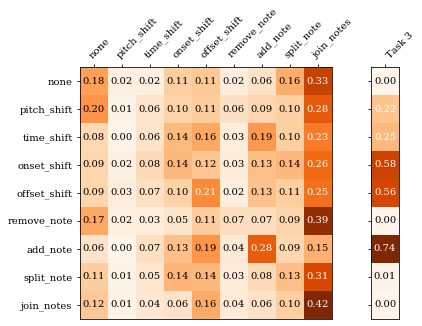

In [4]:
fig = plt.figure(figsize=(6, 6))
spec = gridspec.GridSpec(
    ncols=2,
    nrows=1,
    width_ratios=[9, 1],
#     wspace=0.5,
)
ax0 = fig.add_subplot(spec[0])
plot_confusion(task_eval_log['task2']['test']["confusion_mat"])
ax1 = fig.add_subplot(spec[1], sharey=ax0)
plot_1d_array_per_deg(task_eval_log['task3']['test']['f_per_deg'])
plt.setp(ax1.get_yticklabels(), visible=False)
plt.xticks([0], ["Task 3"], rotation=45, fontname='serif', ha="left")
plt.tight_layout()
plt.savefig(f"{output_dir}/__task2_confusion_and_task3_f.png", dpi=400)
plt.savefig(f"{output_dir}/__task2_confusion_and_task3_f.pdf", dpi=400)

In [5]:
task_name = 'task3'
display(results[task_name])
display(min_idx[task_name])
display(task_eval_log[task_name])
display(results[task_name].loc[min_idx[task_name]])

min_trn_loss  \
task_name expt_name                  lr     wd     hid repeat                 
task3     task3__0.0001_0.0001_100_0 0.0001 0.0001 100 0           0.096401   
          task3__0.0001_0.0001_100_1 0.0001 0.0001 100 1           0.095806   
          task3__0.0001_0.0001_100_2 0.0001 0.0001 100 2           0.094787   
          task3__0.0001_0.0001_250_0 0.0001 0.0001 250 0           0.097137   
          task3__0.0001_0.0001_250_1 0.0001 0.0001 250 1           0.094593   
...                                                                     ...   
          task3__1e-06_1e-06_100_1   1e-06  1e-06  100 1           0.159833   
          task3__1e-06_1e-06_100_2   1e-06  1e-06  100 2           0.161179   
          task3__1e-06_1e-06_250_0   1e-06  1e-06  250 0           0.153512   
          task3__1e-06_1e-06_250_1   1e-06  1e-06  250 1           0.151152   
          task3__1e-06_1e-06_250_2   1e-06  1e-06  250 2           0.153294   

                                                               min_vld_loss  \
task_name expt_name                  lr     wd     hid repeat                 
task3     task3__0.0001_0.0001_100_0 0.0001 0.0001 100 0           0.119824   
          task3__0.0001_0.0001_100_1 0.0001 0.0001 100 1           0.117657   
          task3__0.0001_0.0001_100_2 0.0001 0.0001 100 2           0.117761   
          task3__0.0001_0.0001_250_0 0.0001 0.0001 250 0           0.114330   
          task3__0.0001_0.0001_250_1 0.0001 0.0001 250 1           0.115160   
...                                                                     ...   
          task3__1e-06_1e-06_100_1   1e-06  1e-06  100 1           0.159797   
          task3__1e-06_1e-06_100_2   1e-06  1e-06  100 2           0.160377   
          task3__1e-06_1e-06_250_0   1e-06  1e-06  250 0           0.155135   
          task3__1e-06_1e-06_250_1   1e-06  1e-06  250 1           0.152851   
          task3__1e-06_1e-06_250_2   1e-06  1e-06  250 2           0.155583   

                                                               min_trn_acc  \
task_name expt_name                  lr     wd     hid repeat                
task3     task3__0.0001_0.0001_100_0 0.0001 0.0001 100 0         97.242641   
          task3__0.0001_0.0001_100_1 0.0001 0.0001 100 1         97.292366   
          task3__0.0001_0.0001_100_2 0.0001 0.0001 100 2         97.304048   
          task3__0.0001_0.0001_250_0 0.0001 0.0001 250 0         97.161779   
          task3__0.0001_0.0001_250_1 0.0001 0.0001 250 1         97.263517   
...                                                                    ...   
          task3__1e-06_1e-06_100_1   1e-06  1e-06  100 1         95.229315   
          task3__1e-06_1e-06_100_2   1e-06  1e-06  100 2         95.229293   
          task3__1e-06_1e-06_250_0   1e-06  1e-06  250 0         95.229293   
          task3__1e-06_1e-06_250_1   1e-06  1e-06  250 1         95.239132   
          task3__1e-06_1e-06_250_2   1e-06  1e-06  250 2         95.229293   

                                                               min_vld_acc  
task_name expt_name                  lr     wd     hid repeat               
task3     task3__0.0001_0.0001_100_0 0.0001 0.0001 100 0         96.416696  
          task3__0.0001_0.0001_100_1 0.0001 0.0001 100 1         96.496803  
          task3__0.0001_0.0001_100_2 0.0001 0.0001 100 2         96.487922  
          task3__0.0001_0.0001_250_0 0.0001 0.0001 250 0         96.592185  
          task3__0.0001_0.0001_250_1 0.0001 0.0001 250 1         96.597513  
...                                                                    ...  
          task3__1e-06_1e-06_100_1   1e-06  1e-06  100 1         95.247247  
          task3__1e-06_1e-06_100_2   1e-06  1e-06  100 2         95.247247  
          task3__1e-06_1e-06_250_0   1e-06  1e-06  250 0         95.247247  
          task3__1e-06_1e-06_250_1   1e-06  1e-06  250 1         95.247247  
          task3__1e-06_1e-06_250_2   1e-06  1e-06  250 2         95.

('task3', 'task3__0.0001_1e-05_250_2', '0.0001', '1e-05', '250', '2')

{'train': {'epoch': 0,
  'batch': 281,
  'mode': 'test',
  'avg_loss': 0.1012973276964762,
  'avg_acc': 96.95657098439843,
  'p': 0.9067772675446396,
  'r': 0.4035463403052888,
  'f': 0.5585286651289254,
  'p_per_deg': array([0.        , 0.80891055, 0.79206466, 0.94301043, 0.92079761,
         0.08442982, 0.96397543, 0.01158749, 0.03741497]),
  'r_per_deg': array([0.        , 0.15536836, 0.1751635 , 0.4345656 , 0.40106077,
         0.00539405, 0.65584781, 0.00502513, 0.00436768]),
  'f_per_deg': array([0.        , 0.26066962, 0.28688334, 0.59495793, 0.55875244,
         0.01014025, 0.78060514, 0.00701016, 0.00782222]),
  'avg_acc_per_deg': array([0.998646  , 0.97364718, 0.95710455, 0.94931269, 0.94273127,
         0.97005378, 0.95178937, 0.99429118, 0.98884358])},
 'valid': {'epoch': 0,
  'batch': 35,
  'mode': 'test',
  'avg_loss': 0.11248414391787395,
  'avg_acc': 96.62646536412079,
  'p': 0.8484250201920488,
  'r': 0.3533148964795575,
  'f': 0.49887865755520966,
  'p_per_deg': array

min_trn_loss     0.087425
min_vld_loss     0.112319
min_trn_acc     97.477342
min_vld_acc     96.663588
Name: (task3, task3__0.0001_1e-05_250_2, 0.0001, 1e-05, 250, 2), dtype: float64

In [6]:
with pd.option_context("display.max_colwidth", 100):
    display(res_df)

avg_acc  \
task1         train  0.888957   
              valid  0.885879   
              test   0.891604   
task1weighted train  0.536006   
              valid  0.546625   
              test   0.520213   
task2         train  0.214758   
              valid  0.177176   
              test   0.166593   
task3         train  0.969566   
              valid  0.966265   
              test   0.967405   
task3weighted train  0.818692   
              valid  0.812401   
              test   0.818232   
task4         train  0.991797   
              valid  0.991736   
              test    0.99208   

                                                                                                         avg_acc_per_deg  \
task1         train                                                        [0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]   
              valid                                                        [0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]   
              test                                                         [0.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0, 1.0]   
task1weighted train  [0.4785, 0.544727636181909, 0.512256128064032, 0.5369630369630369, 0.5539460539460539, 0.5428286...   
              valid  [0.5097276264591439, 0.532, 0.5171102661596958, 0.5662650602409639, 0.5245901639344263, 0.559523...   
              test   [0.46311475409836067, 0.5258964143426295, 0.525, 0.5577689243027888, 0.5686274509803921, 0.51239...   
task2         train  [0.216, 0.01899050474762619, 0.09154577288644322, 0.2242757242757243, 0.21678321678321677, 0.073...   
              valid  [0.21011673151750973, 0.008, 0.07984790874524715, 0.1646586345381526, 0.22131147540983606, 0.063...   
              test   [0.1762295081967213, 0.00796812749003984, 0.058333333333333334, 0.1394422310756972, 0.2117647058...   
task3         train  [0.998646, 0.9736471764117941, 0.9571045522761381, 0.9493126873126874, 0.9427312687312688, 0.970...   
              valid  [0.9977120622568093, 0.970064, 0.9529277566539924, 0.9384738955823293, 0.9417540983606557, 0.968...   
              test   [0.9982786885245901, 0.9738326693227092, 0.95145, 0.948796812749004, 0.9403764705882353, 0.96824...   
task3weighted train  [0.819676, 0.8199320339830085, 0.815423711855928, 0.8172327672327673, 0.8249870129870129, 0.8178...   
              valid  [0.8348793774319067, 0.817888, 0.8045627376425856, 0.7963534136546184, 0.8146393442622951, 0.811...   
              test   [0.8232295081967214, 0.8367649402390438, 0.8155, 0.8142310756972112, 0.8216, 0.8063140495867769,...   
task4         train                                                                                                  NaN   
              valid                                                                                                  NaN   
              test                                                                                                   NaN   

                     avg_loss  \
task1         train  0.349145   
              valid   0.35454   
              test     0.3436   
task1weighted train  0.690282   
              valid  0.689689   
              test   0.691092   
task2         train   2.04427   
              valid   2.13049   
              test     2.1315   
task3         train  0.101297   
              valid  0.112484   
              test   0.108572   
task3weighted train  0.339774   
              valid  0.351074   
              test    0.34341   
task4         train  0.693147   
              valid  0.693147   
              test   0.693147   

                                                                                                           confusion_mat  \
task1         train                                                                                                  NaN   
              valid                                                                                                  NaN   
              test                   

In [7]:
res_df[["avg_acc", "avg_loss", "f", "r", "p", "fmeasure", "helpfulness"]]

avg_acc  avg_loss         f         r         p  \
task1         train  0.888957  0.349145  0.941215         1  0.888957   
              valid  0.885879   0.35454  0.939487         1  0.885879   
              test   0.891604    0.3436  0.942696         1  0.891604   
task1weighted train  0.536006  0.690282  0.675469  0.543189  0.892916   
              valid  0.546625  0.689689  0.683018  0.551378  0.897227   
              test   0.520213  0.691092  0.662078  0.527155  0.889823   
task2         train  0.214758   2.04427       NaN       NaN       NaN   
              valid  0.177176   2.13049       NaN       NaN       NaN   
              test   0.166593    2.1315       NaN       NaN       NaN   
task3         train  0.969566  0.101297  0.558529  0.403546  0.906777   
              valid  0.966265  0.112484  0.498879  0.353315  0.848425   
              test   0.967405  0.108572  0.528276  0.383934  0.846534   
task3weighted train  0.818692  0.339774  0.315624  0.876353  0.192472   
              valid  0.812401  0.351074  0.294723  0.824725   0.17942   
              test   0.818232   0.34341  0.302165  0.827826  0.184812   
task4         train  0.991797  0.693147       NaN       NaN       NaN   
              valid  0.991736  0.693147       NaN       NaN       NaN   
              test    0.99208  0.693147       NaN       NaN       NaN   

                    fmeasure helpfulness  
task1         train      NaN         NaN  
              valid      NaN         NaN  
              test       NaN         NaN  
task1weighted train      NaN         NaN  
              valid      NaN         NaN  
              test       NaN         NaN  
task2         train      NaN         NaN  
              valid      NaN         NaN  
              test       NaN         NaN  
task3         train      NaN         NaN  
              valid      NaN         NaN  
              test       NaN         NaN  
task3weighted train      NaN         NaN  
              valid      NaN         NaN  
              test       NaN         NaN  
task4         train        0           0  
              valid        0           0  
              test         0           0

In [8]:
res_df.loc[task_name].dropna(axis=1)

,avg_acc,avg_acc_per_deg,avg_loss,f,f_per_deg,p,p_per_deg,r,r_per_deg
train,0.969566,"[0.998646, 0.9736471764117941, 0.9571045522761...",0.101297,0.558529,"[0.0, 0.2606696203241546, 0.28688333721433085,...",0.906777,"[0.0, 0.8089105464671076, 0.7920646583394563, ...",0.403546,"[0.0, 0.15536836475464635, 0.17516350489499127..."
valid,0.966265,"[0.9977120622568093, 0.970064, 0.9529277566539...",0.112484,0.498879,"[0.0, 0.239121594143961, 0.24823900898712653, ...",0.848425,"[0.0, 0.6295503211991434, 0.6671018276762402, ...",0.353315,"[0.0, 0.14759036144578314, 0.15249179349447925..."
test,0.967405,"[0.9982786885245901, 0.9738326693227092, 0.951...",0.108572,0.528276,"[0.0, 0.21809523809523806, 0.24709227190488497...",0.846534,"[0.0, 0.6189189189189189, 0.6988304093567251, ...",0.383934,"[0.0, 0.13236994219653178, 0.1500784929356358,..."


In [9]:
for ii, task_name in enumerate(task_names):
    print(task_name)
    df = (
        res_df.loc[task_name]
            .dropna(axis=1)  # removes cols with na in them (not a metric for this task)
    )
    if 'confusion_mat' in df.columns:
        confusion_mat = df['confusion_mat'][0]
        plot_confusion(confusion_mat)
        df.drop('confusion_mat', axis=1, inplace=True)
    df = (
        df
            .apply(pd.to_numeric)  # they are strings, convert to int or float
            .applymap(round_to_n)  # round to 3sf
    )
    display(df)

task1


TypeError: ('Invalid object type at position 0', 'occurred at index avg_acc_per_deg')

In [ ]:
summary_tab_

In [ ]:
confusion    

In [ ]:
# Run this if errors to:
# * stop tqdm multiline printing
# * reload packages if you need to change them
# from tqdm import tqdm
# tqdm._instances.clear()

import importlib
import baselines
import baselines.get_results
import mdtk
importlib.reload(baselines.get_results)
# importlib.reload(baselines.eval_task)
# importlib.reload(mdtk.formatters)

In [ ]:
best_models = {task: f'{output_dir}/{task}/{val[1]}.checkpoint.best'
               for task, val in min_idx.items()}
best_logs = {task: f'{output_dir}/{task}/{val[1]}.log'
             for task, val in min_idx.items()}
save_plots = False
print(f"best models: {best_models}")
for task_name, log_file in best_logs.items():
    plot_log_file(log_file)
    plt.title(f'{task_name} best model training curve')
    if save_plots:
        plt.savefig(f'{save_plots}/{task_name}__best_model_loss.png',
                    dpi=300)
        plt.savefig(f'{save_plots}/{task_name}__best_model_loss.pdf',
                    dpi=300)
    plt.show()